In [39]:
import anndata as ad
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

ST_PATH = "/scratch/gpfs/ph3641/mgw/sma_data/adata_st_V11T17-102_A1.h5ad"
MSI_PATH = "/scratch/gpfs/ph3641/mgw/sma_data/adata_msi_V11T17-102_A1.h5ad"

st = ad.read_h5ad(ST_PATH)
msi = ad.read_h5ad(MSI_PATH)

dop = pd.read_csv(
    "/scratch/gpfs/ph3641/mgw/sma_data/mendeley_all/Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues/"
    "processed/sma/sma/V11T17-102/V11T17-102_A1/output_data/V11T17-102_A1_RNA/outs/dopamine.csv"
)

# merge on barcode (Visium barcode format matches .obs_names)
dop = dop.rename(columns={"Barcode": "barcode"})
st.obs = st.obs.merge(dop, how="left", left_index=True, right_on="barcode")
st.obs["dopamine"] = st.obs["dopamine"].astype("category")
print(st.obs["dopamine"].value_counts())


dopamine
not_dopamine_Cd    3745
CI                  939
dopamine_Cd         257
Name: count, dtype: int64


In [40]:
dop

,barcode,dopamine
0,AAACAACGAATAGTTC-1,not_dopamine_Cd
1,AAACAAGTATCTCCCA-1,CI
2,AAACAATCTACTAGCA-1,not_dopamine_Cd
3,AAACACCAATAACTGC-1,not_dopamine_Cd
4,AAACAGAGCGACTCCT-1,not_dopamine_Cd
...,...,...
4963,TTGTTTCACATCCAGG-1,not_dopamine_Cd
4964,TTGTTTCATTAGTCTA-1,not_dopamine_Cd
4965,TTGTTTCCATACAACT-1,not_dopamine_Cd
4966,TTGTTTGTATTACACG-1,not_dopamine_Cd


In [41]:
msi.shape

(4030, 1538)

             I  pval_norm  var_norm  pval_norm_fdr_bh
1052  0.926655        0.0  0.000075               0.0
1051  0.898452        0.0  0.000075               0.0
454   0.855806        0.0  0.000075               0.0
1057  0.852458        0.0  0.000075               0.0
1058  0.847360        0.0  0.000075               0.0
Before: (4030, 1538)  |  marked spatially variable: 20/1538
After:  (4030, 20)


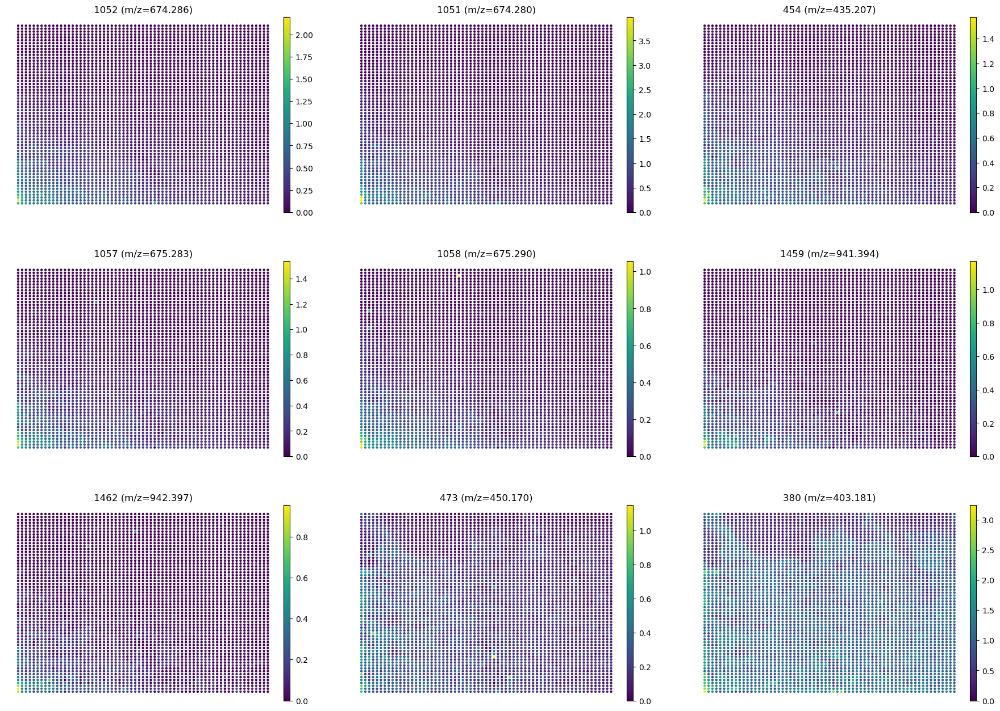

In [42]:
import squidpy as sq
import scanpy as sc

K = 20

sc.pp.normalize_total(msi, target_sum=1e3)

sq.gr.spatial_neighbors(msi, key_added='spatial')
sq.gr.spatial_autocorr(
    msi,
    mode="moran",
    genes=None,
    layer=None,
    n_jobs=8,
)
top_moran = (
    msi.uns["moranI"]
    .sort_values("I", ascending=False)
    .head(K)
)
msi.var["highly_variable_moranI"] = msi.var_names.isin(top_moran.index)

# 1) sanity-check what squidpy returned
print(msi.uns["moranI"].head())         # make sure there's an "I" column and feature names align

# 2) build the mask robustly (handle cases where the result has a 'names' column)
moran_df = msi.uns["moranI"]
if "names" in moran_df.columns:          # some squidpy versions put feature names here
    ranked = moran_df.sort_values("I", ascending=False)["names"].head(K)
else:
    ranked = moran_df.sort_values("I", ascending=False).index[:K]

msi.var["highly_variable_moranI"] = msi.var_names.isin(ranked)

# 3) show counts BEFORE subsetting
n_total = msi.shape[1]
n_keep  = int(msi.var["highly_variable_moranI"].sum())
print(f"Before: {msi.shape}  |  marked spatially variable: {n_keep}/{n_total}")

# 4) actually FILTER columns (variables)
msi = msi[:, msi.var["highly_variable_moranI"]].copy()

# 5) show counts AFTER subsetting
print("After: ", msi.shape)

moran = msi.uns["moranI"]
if "names" in moran.columns:
    ranked = moran.sort_values("I", ascending=False)["names"].tolist()
else:
    ranked = moran.sort_values("I", ascending=False).index.tolist()

top_k = 9
top_feats = ranked[:top_k]
msi.obsm["X_spatial"] = msi.obsm["spatial"]
display_names = [f"{gene} (m/z={msi.var.loc[gene, 'mz']:.3f})" for gene in top_feats]

import scanpy as sc
sc.pl.embedding(
    msi,
    basis="spatial",
    color=top_feats,
    ncols=3,
    frameon=False,
    size=40,
    title=display_names
)


[mgw] device=cuda default_dtype=torch.float64


/home/ph3641/.conda/envs/peterenv2/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/ph3641/ManifoldAlignment/mgw/util.py:247: UserWarning: Ignoring svd_solver='auto' and using randomized, sklearn.decomposition._truncated_svd.TruncatedSVD only supports dict_keys(['arpack', 'randomized']).
  sc.tl.pca(


[mgw] using raw features (no PCA): X=(4968, 8), Z=(4030, 20)
[mgw] running CCA feeler (PCA → GW on fused costs → barycenter → CCA)
Using precomputed PCA (8 comps).
Computing PCA (8 comps)...
Feature shapes -> X: (4968, 8) Z: (4030, 8)
Feeler GW sizes: X-side 4968, Z-side 4030
Solving feeler feature alignment.
Computing CCA Components
CCA dims: 3  (applied to full sets)
[mgw] dims: E=2, F_M=3, F_N=3
[mgw] training φ, ψ
[train_phi] step=1000 loss=0.124618
[train_phi] step=2000 loss=0.105716
[train_phi] step=3000 loss=0.099085
[train_phi] step=4000 loss=0.096005
[train_phi] step=5000 loss=0.093413
[train_phi] step=6000 loss=0.093630
[train_phi] step=7000 loss=0.090138
[train_phi] step=8000 loss=0.088147
[train_phi] step=9000 loss=0.086201
[train_phi] step=10000 loss=0.086896
[train_phi] step=11000 loss=0.084296
[train_phi] step=12000 loss=0.103656
[train_phi] step=13000 loss=0.080793
[train_phi] step=14000 loss=0.084296
[train_phi] step=15000 loss=0.085203
[train_phi] step=16000 loss=0.07

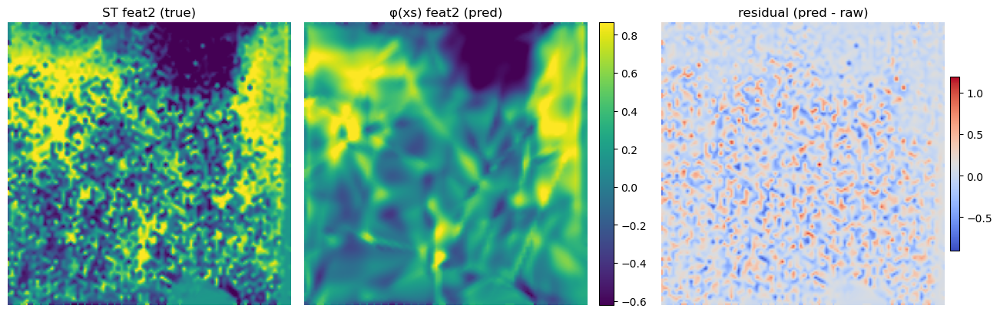

φ feat 2 {'mse': np.float64(0.10596669568125083), 'r2': np.float64(0.5582330772144952), 'corr': np.float64(0.7505803270934217)}


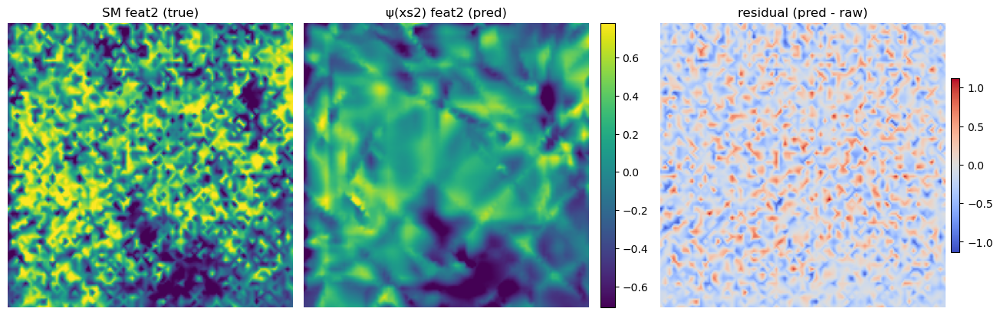

ψ feat 2 {'mse': np.float64(0.1673644479745604), 'r2': np.float64(0.37288986596502005), 'corr': np.float64(0.640540780489391)}


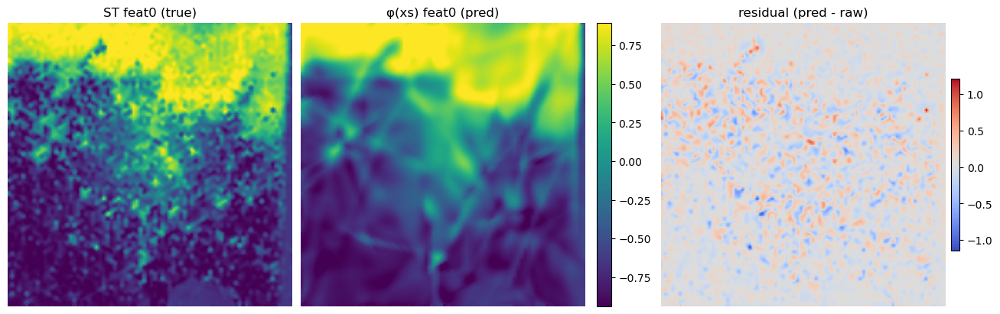

φ feat 0 {'mse': np.float64(0.047596165866099945), 'r2': np.float64(0.8852063663552817), 'corr': np.float64(0.9417105295078506)}


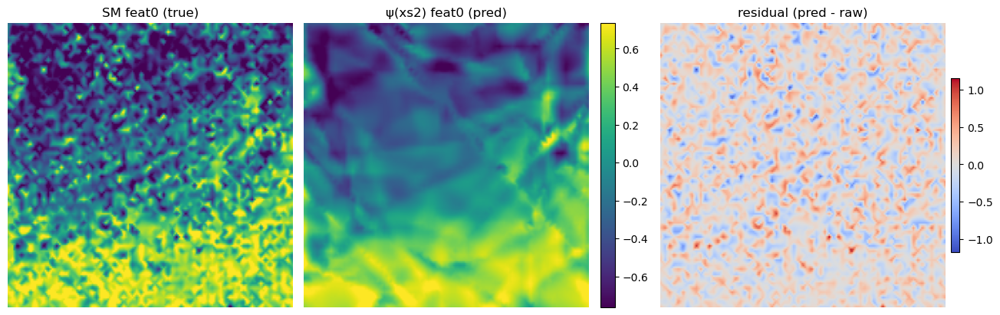

ψ feat 0 {'mse': np.float64(0.10806103287725222), 'r2': np.float64(0.6062270414746713), 'corr': np.float64(0.7799355185925707)}


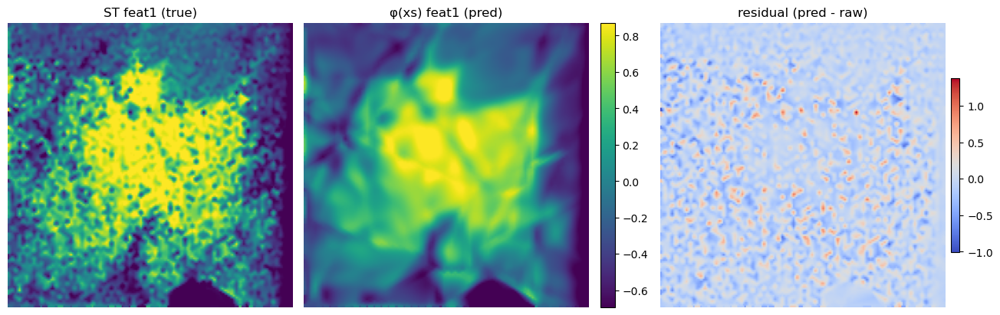

φ feat 1 {'mse': np.float64(0.06981309223906161), 'r2': np.float64(0.7367805178096314), 'corr': np.float64(0.8601421888026841)}


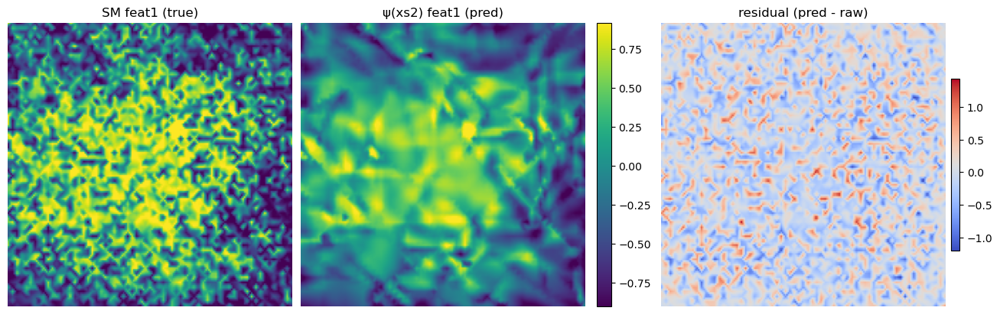

ψ feat 1 {'mse': np.float64(0.22808738409240387), 'r2': np.float64(0.4924114410617032), 'corr': np.float64(0.7023503501089147)}
[mgw] computing pullback metrics
Rescaling Jacobians by 100.95447842289812.
Rescaling Jacobians by 263.90491214772123.
[mgw] building kNN graphs
[mgw] geodesic distances
[mgw] solving GW with params={'verbose': True, 'inner_maxit': 3000, 'outer_maxit': 3000, 'inner_tol': 1e-07, 'outer_tol': 1e-07, 'epsilon': 0.0001}
[mgw] coupling: shape=(4968, 4030), mass=0.999991


In [43]:
import scanpy as sc
from mgw import mgw
from mgw import util
from mgw import gw
import importlib
importlib.reload(gw)
importlib.reload(mgw)
importlib.reload(util)

out = mgw.mgw_align(
    st, msi,
    PCA_comp=8, CCA_comp=3, use_cca_feeler=True,
    knn_k=12, geodesic_eps=1e-2,
    widths=(128,256,256,128),
    lr=1e-3, niter=20_000, print_every=1_000,
    save_dir="/scratch/gpfs/ph3641/mgw/mgw_temp", tag="st_msi_V11T17-102_A1",
    max_obs_A=10_000, max_obs_B=10_000,
    verbose=True, 
    plot_net=True,
    spatial_only=True,
    feature_only=False,
    log1p_X = True,
    log1p_Z = False,
    use_pca_X = True,
    use_pca_Z = False
)

P = out["P"]


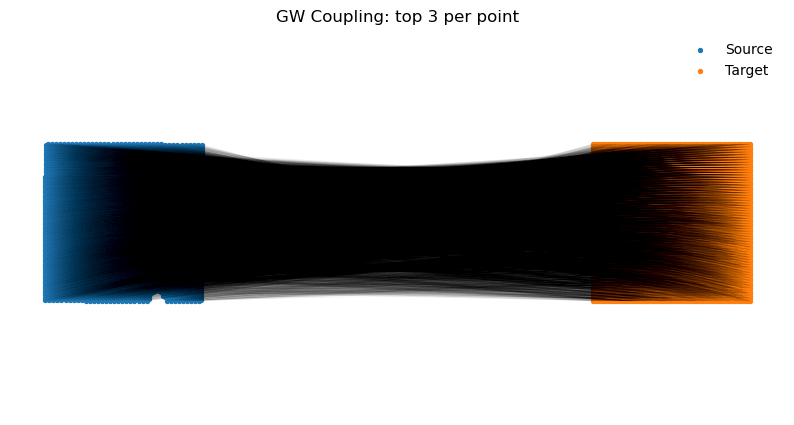

In [44]:
from mgw import plotting

xs = out["xs"]
xs2 = out["xs2"]

plotting.plot_alignment_lines_dense(xs, xs2, P, alpha=0.05)


In [62]:
# === Compact validation cell (same functionality, fewer lines) ===
import numpy as np, pandas as pd, scipy.sparse as sp, matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, average_precision_score, roc_curve, precision_recall_curve
from sklearn.neighbors import KDTree
from sklearn.preprocessing import MinMaxScaler
from mgw import util

# ---------- helpers ----------
def to_1d(x):
    if sp.issparse(x): return x.toarray().ravel().astype(float)
    x = np.asarray(x);  return (x.reshape(x.shape[0], -1)[:,0] if x.ndim>1 else x).astype(float)

def rownorm(M):
    M = M.tocsr() if not sp.isspmatrix_csr(M) else M
    rs = np.array(M.sum(axis=1)).ravel()
    return sp.diags(1.0/np.maximum(rs,1e-12)) @ M

def orient_P(P, n_st, n_msi):
    return P if P.shape==(n_st,n_msi) else (P.T if P.shape==(n_msi,n_st) else (_ for _ in ()).throw(ValueError(f"Bad P shape {P.shape}")))

def eval_proj(P_st_msi, mz_target, ppm=25, pos=["dopamine_Cd"]):
    '''
    AUROC: how does the rank order of the target metabolite's projection under P separate dopaminergic GT label or not.
    (AUPRC: more sensitive if positives are rare)
    '''
    # "CI"
    # Evaluate mz values
    mz = msi.var["mz"].values.astype(float)
    # Identify diff from target, pick optimal index for that target
    j  = int(np.argmin(np.abs(mz - mz_target)))
    if 1e6*abs(mz[j]-mz_target)/mz_target > ppm: print(f"[warn] {mz_target} -> {mz[j]:.5f} (> {ppm} ppm)")
    # Intensity of target m/z channel
    inten = to_1d(msi.X[:, j])
    # normalize
    inten /= np.percentile(inten,99)+1e-9
    # Barycentric projection of m/z onto ST spots via P
    s = to_1d(rownorm(P_st_msi) @ inten)
    # Whether ST dopaminergic or not
    y = st.obs["dopamine"].astype(str).isin(pos).astype(int).to_numpy()
    if y.sum() in (0, len(y)): return np.nan, np.nan, s
    # Scale, fit-transform s
    s = MinMaxScaler().fit_transform(s.reshape(-1,1)).ravel()
    # Evaluate AUROC, AUPRC scores 
    return roc_auc_score(y,s), average_precision_score(y,s), s

def make_baselines():
    xy_st, xy_msi = st.obsm["spatial"], msi.obsm["spatial"]
    # 1-NN
    idx = KDTree(xy_msi).query(xy_st, k=1)[1].ravel()
    rows = np.arange(st.n_obs)
    P_nn = sp.csr_matrix((np.ones(st.n_obs), (rows, idx)), shape=(st.n_obs, msi.n_obs))
    # Gaussian k-NN
    dist = KDTree(xy_msi).query(xy_st, k=1)[0]
    sigma = np.median(dist)+1e-9; k=25
    dists, nbrs = KDTree(xy_msi).query(xy_st, k=k)
    W = np.exp(-(dists**2)/(2*sigma**2))
    P_g = sp.csr_matrix((W.ravel(), (np.repeat(rows,k), nbrs.ravel())), shape=(st.n_obs, msi.n_obs))
    # Uniform
    P_u = sp.csr_matrix(np.ones((st.n_obs, msi.n_obs))/msi.n_obs)
    return {"Learned_P": P_learned, "NN_1": P_nn, "Gaussian": P_g, "Uniform": P_u}

def plot_curves(y, s, title):
    fpr,tpr,_ = roc_curve(y,s); prec,rec,_ = precision_recall_curve(y,s)
    plt.figure(figsize=(5,4.2)); plt.plot(fpr,tpr); plt.plot([0,1],[0,1],'--',lw=1)
    plt.xlabel("FPR"); plt.ylabel("TPR"); plt.title(f"ROC — {title}"); plt.grid(alpha=.2); plt.show()
    plt.figure(figsize=(5,4.2)); plt.plot(rec,prec); plt.xlabel("Recall"); plt.ylabel("Precision")
    plt.title(f"PR — {title}"); plt.grid(alpha=.2); plt.show()

def plot_spatial(xy, c, title, cmap="inferno", s=10):
    plt.figure(figsize=(6,6)); plt.scatter(xy[:,0], xy[:,1], c=c, s=s, cmap=cmap)
    plt.gca().invert_yaxis(); plt.axis("equal"); plt.colorbar(label="scaled"); plt.title(title); plt.show()


In [8]:

# ---------- inputs, P, targets ----------
print(f"ST: {st.n_obs} spots, {st.n_vars} genes   |   MSI: {msi.n_obs} pixels, {msi.n_vars} m/z")
P = out["P"] if isinstance(out,dict) and "P" in out else P
P = sp.csr_matrix(P) if not sp.issparse(P) else P
P_learned = orient_P(P, st.n_obs, msi.n_obs)

targets = {"DA_single":421.19, "DA_double":674.28, "3MT":435.21}

# ---------- single evaluation (mirrors your earlier block) ----------
auroc, auprc, s_proj = eval_proj(P_learned, targets["DA_double"])
print(f"MSI→ST (via Learned_P, DA_double): AUROC={auroc:.3f} | AUPRC={auprc:.3f}")

# curves + spatial map
y_bin = st.obs["dopamine"].astype(str).isin(["dopamine_Cd"]).astype(int).to_numpy() # "CI"
plot_curves(y_bin, s_proj, "Learned_P / DA_double")
plot_spatial(st.obsm["spatial"], y_bin.astype(float), "True dopaminergic spots", cmap="coolwarm")
plot_spatial(st.obsm["spatial"], s_proj, "Projected MSI dopamine → ST (DA_double)")

# ---------- baselines & full comparison ----------
records, scores = [], {}
for mname, Pm in make_baselines().items():
    for tname, mzv in targets.items():
        au, ap, s = eval_proj(Pm, mzv); records.append({"method":mname,"target":tname,"mz":mzv,"AUROC":au,"AUPRC":ap})
        scores[(mname,tname)] = s
df = pd.DataFrame(records).sort_values(["target","AUROC"], ascending=[True,False])
print(df.to_string(index=False))

best = df.sort_values("AUROC", ascending=False).iloc[0]
print("\nBest:", best.to_dict())
plot_curves(y_bin, scores[(best["method"], best["target"])], f"{best['method']} / {best['target']} (AUROC={best['AUROC']:.3f})")


In [50]:
# ============================
# Standard Baselines Benchmark (lazy + robust)
# ============================
# If you want MOSCOT to work, install CPU JAX first, then restart the kernel:
#   python -m pip install --upgrade "jax[cpu]==0.4.30" "jaxlib==0.4.30"
# Other deps (install as needed):
#   python -m pip install POT SCOT SCOTv2 paste-bio scikit-image scikit-learn moscot

import numpy as np, pandas as pd, scipy.sparse as sp, matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import roc_auc_score, average_precision_score, roc_curve, precision_recall_curve
from sklearn.neighbors import KDTree, NearestNeighbors
from mgw import util
from sklearn.utils import check_array
from scipy.spatial.distance import cdist
from scipy.optimize import linear_sum_assignment

import moscot.plotting as mtp
from moscot import datasets
from moscot.problems.cross_modality import TranslationProblem

import sys
sys.path.insert(1, '/home/ph3641/Packages/SCOT/src')
import scotv1, scotv2
importlib.reload(scotv1)

# expect: st, msi already loaded (AnnData); st.obs['dopamine'] exists; st/msi .obsm['spatial'] exist.

def _to_csr(P):
    return P if sp.isspmatrix_csr(P) else sp.csr_matrix(P)

def _to_1d(x):
    if sp.issparse(x): return x.toarray().ravel().astype(float)
    x = np.asarray(x); return (x.reshape(x.shape[0], -1)[:,0] if x.ndim>1 else x).astype(float)

def _rownorm(P):
    P = _to_csr(P)
    rs = np.asarray(P.sum(axis=1)).ravel()
    rs[rs == 0] = 1.0
    return sp.diags(1.0/rs) @ P

def _colnorm(P):
    P = _to_csr(P)
    cs = np.asarray(P.sum(axis=0)).ravel()
    cs[cs == 0] = 1.0
    return P @ sp.diags(1.0/cs)

def translate_with_P(P, X_src=None, Y_tgt=None, *, direction="src->tgt", row_normalize=True, col_normalize=False):
    """
    Generic barycentric translation using a coupling P (shape n_src x n_tgt).

    direction:
      - "src->tgt": return X_src mapped into target space using target coordinates Y_tgt (n_tgt x d)
                    result is (n_src x d): for each source i, weighted avg of target Y by P[i,:].
      - "tgt->src": return Y_tgt mapped into source space using source coordinates X_src (n_src x d)
                    result is (n_tgt x d): for each target j, weighted avg of source X by P[:,j].
    """
    P = _to_csr(P)
    if direction == "src->tgt":
        if Y_tgt is None:
            raise ValueError("Need Y_tgt (target coordinates) for src->tgt translation.")
        Pn = _rownorm(P) if row_normalize else P
        return Pn @ check_array(Y_tgt, dtype=float)
    elif direction == "tgt->src":
        if X_src is None:
            raise ValueError("Need X_src (source coordinates) for tgt->src translation.")
        Pn = _colnorm(P) if col_normalize else P  # normalize columns if you want barycentric over source
        return Pn.T @ check_array(X_src, dtype=float)
    else:
        raise ValueError("direction must be 'src->tgt' or 'tgt->src'.")

'''
def eval_proj(P_st_msi, mz_target, ppm=25, pos=("dopamine_Cd")):
    mz = msi.var["mz"].values.astype(float)
    j  = int(np.argmin(np.abs(mz - mz_target)))
    if 1e6*abs(mz[j]-mz_target)/mz_target > ppm:
        print(f"[warn] {mz_target} -> using {mz[j]:.5f} (> {ppm} ppm)")
    inten = _to_1d(msi.X[:, j]); inten /= np.percentile(inten,99)+1e-9
    s = _to_1d(_rownorm(P_st_msi) @ inten)
    y = st.obs["dopamine"].astype(str).isin(pos).astype(int).to_numpy()
    if y.sum() in (0, len(y)): return np.nan, np.nan, s
    s = MinMaxScaler().fit_transform(s.reshape(-1,1)).ravel()
    return roc_auc_score(y,s), average_precision_score(y,s), s

def foscttm(X, Y, *, pairing="diagonal", metric="euclidean", return_details=False):
    """
    Fraction Of Samples Closer Than True Match (lower is better).
    Assumes X and Y have a 1-1 intended correspondence.

    pairing:
      - "diagonal": assumes X[i] ↔ Y[i] for i=0..min(n)-1 (truncates to min size).
      - "hungarian": builds a surrogate 1-1 pairing via linear_sum_assignment on distances.
                     Useful when you don't have true pairs (diagnostic only).
    """
    X = check_array(X, dtype=float)
    Y = check_array(Y, dtype=float)
    if X.shape[0] == 0 or Y.shape[0] == 0:
        raise ValueError("Empty inputs.")
    # equalize counts if needed
    if pairing == "diagonal":
        n = min(X.shape[0], Y.shape[0])
        Xp, Yp = X[:n], Y[:n]
        D = cdist(Xp, Yp, metric=metric)
        true = np.arange(n)
    elif pairing == "hungarian":
        # build full distance then get 1-1 assignment
        n = min(X.shape[0], Y.shape[0])
        D = cdist(X[:n], Y[:n], metric=metric)
        row_ind, col_ind = linear_sum_assignment(D)
        # reindex so that "true match" is diagonal
        D = D[row_ind, :][:, col_ind]
        true = np.arange(len(row_ind))
    else:
        raise ValueError("pairing must be 'diagonal' or 'hungarian'.")

    # fraction of impostors closer than the true match, per sample
    true_dist = D[true, true]
    fos_x = (D < true_dist[:, None]).mean(axis=1)
    fos_y = (D < true_dist[None, :]).mean(axis=0)
    vals = 0.5*(fos_x + fos_y)
    out = float(np.mean(vals).round(4))
    if return_details:
        return out, {"per_sample": vals, "D": D, "true_index": true}
    return out

def evaluate_coupling_foscttm(P, X_src, Y_tgt, *, direction="src->tgt", pairing="diagonal", metric="euclidean"):
    """
    1) Translate with P
    2) Compute FOSCTTM between translated embeddings and the ground-truth counterpart.

    If direction='src->tgt', we compare translated_src (n_src x d) vs Y_tgt.
    If sizes differ or pairs unknown, set pairing='hungarian' (diagnostic).
    """
    if direction == "src->tgt":
        translated = translate_with_P(P, X_src=X_src, Y_tgt=Y_tgt, direction="src->tgt")
        # need same length for 'diagonal'; trunc handled in foscttm
        score = foscttm(Y_tgt, translated, pairing=pairing, metric=metric)
        return score, translated
    elif direction == "tgt->src":
        translated = translate_with_P(P, X_src=X_src, Y_tgt=Y_tgt, direction="tgt->src")
        score = foscttm(X_src, translated, pairing=pairing, metric=metric)
        return score, translated
    else:
        raise ValueError("direction must be 'src->tgt' or 'tgt->src'.")
'''

xy_st, xy_msi = st.obsm["spatial"].astype(float), msi.obsm["spatial"].astype(float)

def run_moscot(
    n_pca_st=30, n_pca_msi=30,
    var_keep_st=2000, var_keep_msi=800,
    k_soft=25, 
    alpha=1.0, max_iter=5_000, tol=1e-7
):
    import numpy as np, scipy.sparse as sp
    from sklearn.decomposition import PCA
    from sklearn.preprocessing import StandardScaler, normalize
    from sklearn.neighbors import NearestNeighbors
    from moscot.problems import TranslationProblem
    
    # --- 0) Build latent reps (genes for ST, m/z for MSI) ---
    # PCA computed identically as MGW
    # ST:  
    Zs = util.pca_from(st, n_comps=10, log1p=True)
    # MSI: 
    Zm = util.pca_from(msi, n_comps=10, log1p=True)
    
    # L2-normalize rows (like the demo)
    Zs_l2 = normalize(Zs, norm="l2")
    Zm_l2 = normalize(Zm, norm="l2")
    
    # Put into .obsm for MOSCOT
    st_tmp, msi_tmp = st.copy(), msi.copy()
    st_tmp.obsm["GEX_X_pca"] = Zs_l2
    msi_tmp.obsm["MSI_X_pca"] = Zm_l2
    
    # --- 1) MOSCOT translate MSI -> RNA latent ---
    tp = TranslationProblem(adata_src=st_tmp, adata_tgt=msi_tmp)
    tp = tp.prepare(src_attr="GEX_X_pca", tgt_attr="MSI_X_pca")
    tp = tp.solve(alpha=alpha)
    sub = tp.problems[("src", "tgt")]
    P = np.array(sub.solution.transport_matrix)
    return sp.csr_matrix(P)

def run_scot(n_components=30,
            # Using recommended settings: https://rsinghlab.github.io/SCOT/tutorial/
             k= 50, epsilon= 0.005, norm=True):
    
    try:
        from sklearn.preprocessing import StandardScaler, normalize
        # --- 0) Build latent reps (genes for ST, m/z for MSI) ---
        # PCA computed identically as MGW
        # ST:
        Zs = util.pca_from(st, n_comps=10, log1p=True)
        # MSI:
        Zm = util.pca_from(msi, n_comps=10, log1p=True)
        # L2-normalize rows
        domain1 = normalize(Zs, norm="l2")
        domain2 = normalize(Zm, norm="l2")
        importlib.reload(scotv1)
        scot_aligner=scotv1.SCOT(domain1, domain2)
        aligned_domain1, aligned_domain2= scot_aligner.align(k=k, e=epsilon, normalize=norm)
        P = scot_aligner.coupling
        P = np.array(P)
        return sp.csr_matrix(P)
    except Exception as e:
        print(f"[skip] SCOT: {e}")
        return None

def run_scot_v2(n_components=30,
            # Using recommended settings: https://rsinghlab.github.io/SCOT/tutorial/
             k= 50, epsilon= 1e-3, norm=True):
    try:
        from sklearn.preprocessing import StandardScaler, normalize
        # --- 0) Build latent reps (genes for ST, m/z for MSI) ---
        # PCA computed identically as MGW
        # ST:
        Zs = util.pca_from(st, n_comps=10, log1p=True)
        # MSI:
        Zm = util.pca_from(msi, n_comps=10, log1p=True)
        # L2-normalize rows
        domain1 = normalize(Zs, norm="l2")
        domain2 = normalize(Zm, norm="l2")
        scot_aligner=scotv2.SCOTv2([domain1, domain2])
        aligned_domain1, aligned_domain2= scot_aligner.align(normalize=True, 
                                                             k=50, 
                                                             eps=0.005, 
                                                             rho=0.1, 
                                                             projMethod="barycentric")
        #(k=k, e=epsilon, normalize=norm)
        P = scot_aligner.couplings[0]
        P = np.array(P)
        return sp.csr_matrix(P)
    except Exception as e:
        print(f"[skip] SCOT: {e}")
        return None

def run_paste_spatial_only(alpha=1.0, n_iters=200, try_old_api=True):
    import numpy as np, pandas as pd, scipy.sparse as sp
    def _spatial_only_copy(src):
        xy = np.asarray(src.obsm["spatial"], dtype=np.float64)
        xy = (xy - xy.min(axis=0)) / (xy.max(axis=0) - xy.min(axis=0) + 1e-12)
        ad_tmp = ad.AnnData(
            X=xy,                                  # (n, 2)
            var=pd.DataFrame(index=["sp_x","sp_y"])
        ).copy()
        ad_tmp.obsm["spatial"] = np.asarray(src.obsm["spatial"], dtype=float)  # the original coords
        print(ad_tmp)
        return ad_tmp
    
    st_tmp  = _spatial_only_copy(st)
    msi_tmp = _spatial_only_copy(msi)
    
    try:
        from paste2 import PASTE2
        P = PASTE2.partial_pairwise_align(st_tmp, msi_tmp, s=0.7)
        return sp.csr_matrix(P)
    except Exception as e:
        print(f"paste.pairwise_align failed: {e}")

def run_pot_fgw_spatial():
    try:
        import ot
        Cs = ot.utils.dist(xy_st, xy_st);  Cs **= 2
        Cm = ot.utils.dist(xy_msi, xy_msi); Cm **= 2
        P = ot.gromov.gromov_wasserstein(Cs, Cm, loss_fun='square_loss', epsilon=5e-2, max_iter=500, verbose=False)
        return sp.csr_matrix(P)
    except Exception as e:
        print(f"[skip] POT-FGW: {e}")
        return None

def run_MGW():
    try:
        out = mgw.mgw_align(
            st, msi,
            PCA_comp=8, CCA_comp=3, use_cca_feeler=True,
            knn_k=12, geodesic_eps=1e-2,
            widths=(128,256,256,128),
            lr=1e-3, niter=20_000, print_every=1_000,
            save_dir="/scratch/gpfs/ph3641/mgw/mgw_temp", tag="st_msi_V11T17-102_A1",
            max_obs_A=10_000, max_obs_B=10_000,
            verbose=True, 
            plot_net=True,
            spatial_only=True,
            feature_only=False,
            log1p_X = True,
            log1p_Z = False,
            use_pca_X = True,
            use_pca_Z = False
        )
        P = out["P"]
        return sp.csr_matrix(P)
    except Exception as e:
        print(f"[skip] M-GW: {e}")
        return None


[run] Manifold GW: computing alignment...
[mgw] device=cuda default_dtype=torch.float64
[mgw] using raw features (no PCA): X=(4968, 8), Z=(4030, 20)
[mgw] running CCA feeler (PCA → GW on fused costs → barycenter → CCA)
Using precomputed PCA (10 comps).
Using precomputed PCA (10 comps).
Feature shapes -> X: (4968, 8) Z: (4030, 8)
Feeler GW sizes: X-side 4968, Z-side 4030


/home/ph3641/.conda/envs/peterenv2/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


Solving feeler feature alignment.
Computing CCA Components
CCA dims: 3  (applied to full sets)
[mgw] dims: E=2, F_M=3, F_N=3
[mgw] loading cached φ, ψ


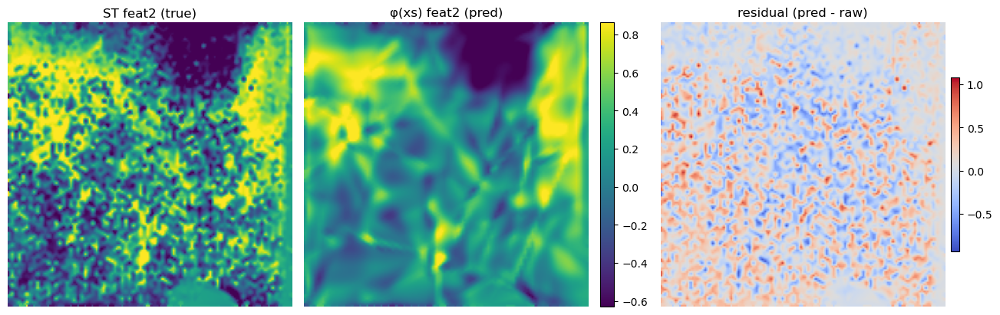

φ feat 2 {'mse': np.float64(0.12176420286932738), 'r2': np.float64(0.5137997591747192), 'corr': np.float64(0.7228851180543967)}


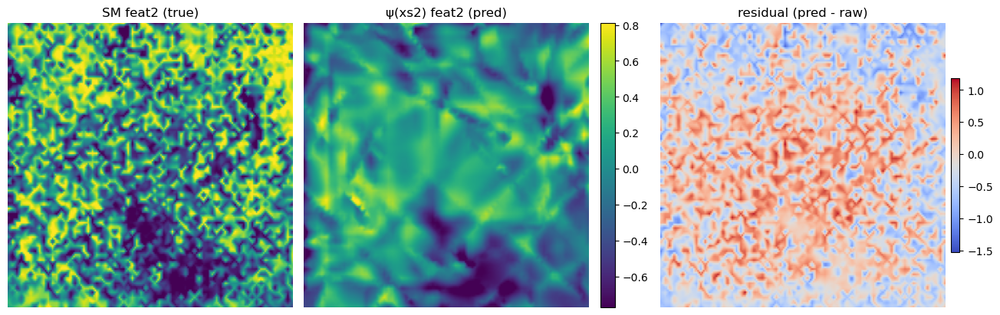

ψ feat 2 {'mse': np.float64(0.3056430758208065), 'r2': np.float64(0.11997973095454739), 'corr': np.float64(0.3972400240556313)}


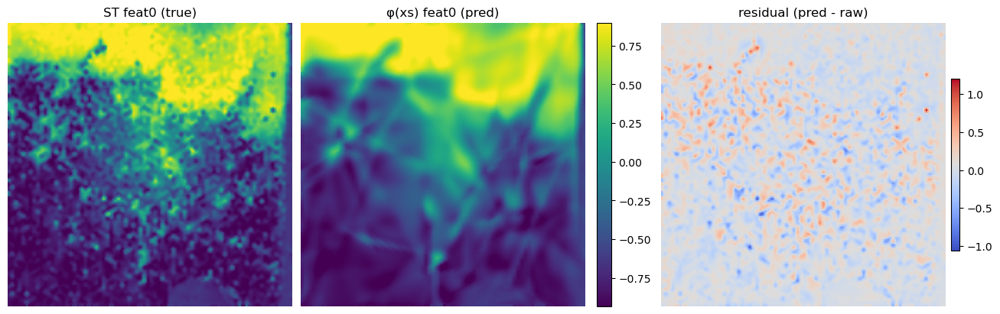

φ feat 0 {'mse': np.float64(0.04601221016168183), 'r2': np.float64(0.8884052237633652), 'corr': np.float64(0.9436260375970276)}


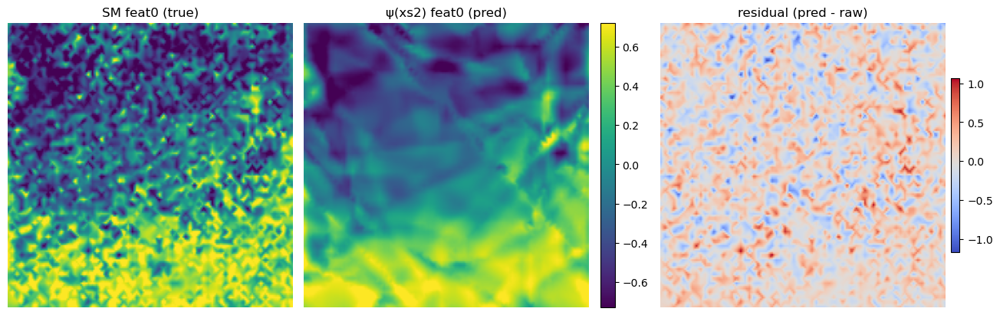

ψ feat 0 {'mse': np.float64(0.11034381798495368), 'r2': np.float64(0.5683170785882143), 'corr': np.float64(0.7571039723288161)}


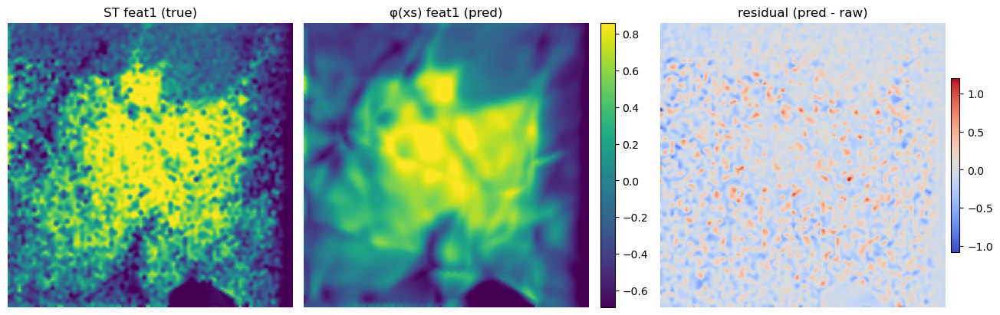

φ feat 1 {'mse': np.float64(0.0665923162225063), 'r2': np.float64(0.7423543131197181), 'corr': np.float64(0.8636018673410865)}


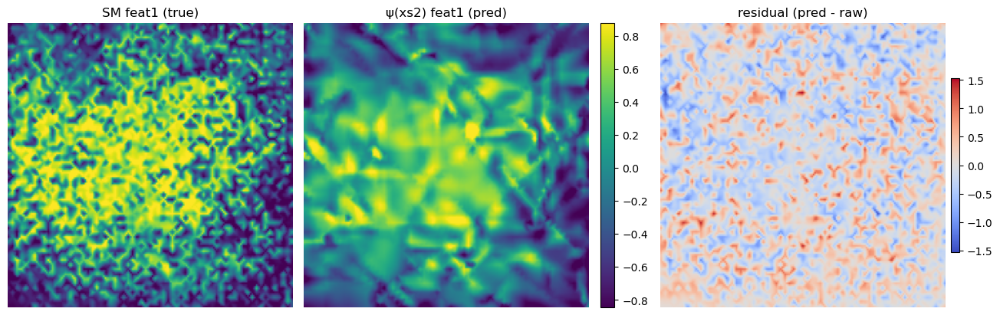

ψ feat 1 {'mse': np.float64(0.24325792891129497), 'r2': np.float64(0.38180768930316245), 'corr': np.float64(0.6257031185420528)}
[mgw] computing pullback metrics
Rescaling Jacobians by 100.95447842289812.
Rescaling Jacobians by 263.90491214772123.
[mgw] building kNN graphs
[mgw] geodesic distances
[mgw] solving GW with params={'verbose': True, 'inner_maxit': 3000, 'outer_maxit': 3000, 'inner_tol': 1e-07, 'outer_tol': 1e-07, 'epsilon': 0.0001}
[mgw] coupling: shape=(4968, 4030), mass=0.999991
[saved] Manifold GW: /scratch/gpfs/ph3641/mgw/SM_Alignments/Manifold GW.npz
[run] SCOT_v1: computing alignment...


/home/ph3641/.conda/envs/peterenv2/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/ph3641/ManifoldAlignment/mgw/util.py:247: UserWarning: Ignoring svd_solver='auto' and using randomized, sklearn.decomposition._truncated_svd.TruncatedSVD only supports dict_keys(['arpack', 'randomized']).
  sc.tl.pca(


It.  |Err         
-------------------
    0|2.337286e-04|
   10|1.388248e-05|
   20|1.308148e-06|
   30|3.231456e-07|
   40|9.028203e-08|
   50|2.595295e-08|
   60|7.501296e-09|
   70|2.170157e-09|
   80|6.279387e-10|
[saved] SCOT_v1: /scratch/gpfs/ph3641/mgw/SM_Alignments/SCOT_v1.npz
[run] PASTE2: computing alignment...
AnnData object with n_obs × n_vars = 4968 × 2
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 4030 × 2
    obsm: 'spatial'
PASTE2 starts...
Starting GLM-PCA...
Iteration: 0 | deviance=1.8889E+3
Iteration: 1 | deviance=1.8889E+3
Iteration: 2 | deviance=1.8875E+3
Iteration: 3 | deviance=2.8193E+2
Iteration: 4 | deviance=2.1473E+2
Iteration: 5 | deviance=2.1314E+2
Iteration: 6 | deviance=6.6173E+1
Iteration: 7 | deviance=6.2370E+1
Iteration: 8 | deviance=5.7627E+1
Iteration: 9 | deviance=5.4010E+1
Iteration: 10 | deviance=5.1132E+1
Iteration: 11 | deviance=4.8925E+1
Iteration: 12 | deviance=4.7170E+1
Iteration: 13 | deviance=4.5690E+1
Iteration: 14 | deviance=4.

/home/ph3641/.conda/envs/peterenv2/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/ph3641/ManifoldAlignment/mgw/util.py:247: UserWarning: Ignoring svd_solver='auto' and using randomized, sklearn.decomposition._truncated_svd.TruncatedSVD only supports dict_keys(['arpack', 'randomized']).
  sc.tl.pca(


computing intra-domain graph distances
running pairwise dataset alignments
Unbalanced GW step: 0
FLAGS [True]


/tmp/ipykernel_1288711/3229275541.py:233: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  P = np.array(P)


[saved] SCOT_v2: /scratch/gpfs/ph3641/mgw/SM_Alignments/SCOT_v2.npz
[run] MOSCOT_translation: computing alignment...


/home/ph3641/.conda/envs/peterenv2/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/ph3641/ManifoldAlignment/mgw/util.py:247: UserWarning: Ignoring svd_solver='auto' and using randomized, sklearn.decomposition._truncated_svd.TruncatedSVD only supports dict_keys(['arpack', 'randomized']).
  sc.tl.pca(


INFO     Solving `1` problems                                                                                      
INFO     Solving problem OTProblem[stage='prepared', shape=(4968, 4030)].                                          


/home/ph3641/.conda/envs/peterenv2/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


[saved] MOSCOT_translation: /scratch/gpfs/ph3641/mgw/SM_Alignments/MOSCOT_translation.npz
[run] POT_GW_spatial: computing alignment...
[saved] POT_GW_spatial: /scratch/gpfs/ph3641/mgw/SM_Alignments/POT_GW_spatial.npz


In [51]:

import os, scipy.sparse as sp

ALIGN_DIR = "/scratch/gpfs/ph3641/mgw/SM_Alignments"

def _load_or_run(name: str, func, *args, **kwargs):
    """Load alignment if exists; otherwise run and save."""
    os.makedirs(ALIGN_DIR, exist_ok=True)
    path = os.path.join(ALIGN_DIR, f"{name}.npz")
    
    if os.path.exists(path):
        print(f"[cached] {name}: loading from {path}")
        return sp.load_npz(path)

    print(f"[run] {name}: computing alignment...")
    P = func(*args, **kwargs)
    if P is not None:
        sp.save_npz(path, P)
        print(f"[saved] {name}: {path}")
    return P

methods = {
    "Manifold GW":_load_or_run("Manifold GW", run_MGW),
    "SCOT_v1":_load_or_run("SCOT_v1", run_scot),
    "PASTE2":_load_or_run("PASTE2", run_paste_spatial_only),
    "SCOT_v2":_load_or_run("SCOT_v2", run_scot_v2),
    "MOSCOT_translation":_load_or_run("MOSCOT_translation", run_moscot),
    "POT_GW_spatial":_load_or_run("POT_GW_spatial", run_pot_fgw_spatial)
}


Available methods: ['Manifold GW', 'SCOT_v1', 'PASTE2', 'SCOT_v2', 'MOSCOT_translation', 'POT_GW_spatial']
[warn] 421.19 -> 435.20692 (> 25 ppm)
[warn] 421.19 -> 435.20692 (> 25 ppm)
[warn] 421.19 -> 435.20692 (> 25 ppm)
[warn] 421.19 -> 435.20692 (> 25 ppm)
[warn] 421.19 -> 435.20692 (> 25 ppm)
[warn] 421.19 -> 435.20692 (> 25 ppm)
            method    target     mz    AUROC    AUPRC
       Manifold GW       3MT 435.21 0.986757 0.791985
           SCOT_v1       3MT 435.21 0.798755 0.146961
           SCOT_v2       3MT 435.21 0.727800 0.114495
            PASTE2       3MT 435.21 0.636463 0.076287
    POT_GW_spatial       3MT 435.21 0.516598 0.078943
MOSCOT_translation       3MT 435.21 0.215823 0.039860
       Manifold GW DA_double 674.28 0.985215 0.763844
           SCOT_v1 DA_double 674.28 0.807639 0.150885
           SCOT_v2 DA_double 674.28 0.691375 0.094193
            PASTE2 DA_double 674.28 0.642967 0.081408
    POT_GW_spatial DA_double 674.28 0.532426 0.083582
MOSCOT_translatio

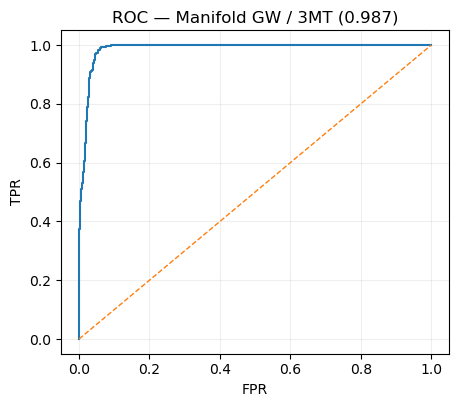

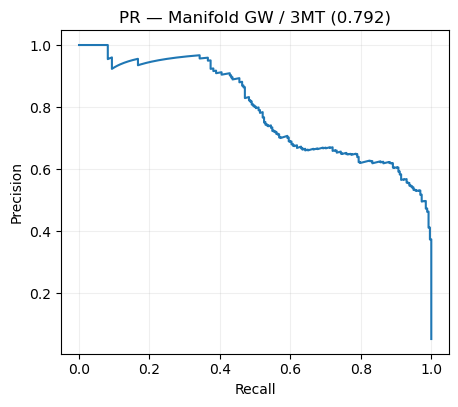

In [68]:

methods = {k:v for k,v in methods.items() if v is not None}
print("Available methods:", list(methods.keys()))

targets = {"DA_single":421.19, "DA_double":674.28, "3MT":435.21}
recs, scores_cache = [], {}

for mname, Pm in methods.items():
    for tname, mzv in targets.items():
        P = sp.csr_matrix(Pm) if not sp.issparse(Pm) else Pm
        P_learned = orient_P(P, st.n_obs, msi.n_obs)
        auroc, auprc, s = eval_proj(Pm, mzv)
        recs.append({"method": mname, "target": tname, "mz": mzv, "AUROC": auroc, "AUPRC": auprc})
        scores_cache[(mname,tname)] = s

df_all = pd.DataFrame(recs).sort_values(["target","AUROC"], ascending=[True, False])
print(df_all.to_string(index=False))

# Plot the best overall
y = st.obs["dopamine"].astype(str).isin(["dopamine_Cd"]).astype(int).to_numpy()
best = df_all.sort_values("AUROC", ascending=False).iloc[0]
s = scores_cache[(best["method"], best["target"])]
fpr, tpr, _ = roc_curve(y, s)
prec, rec, _ = precision_recall_curve(y, s)
plt.figure(figsize=(5,4.2)); plt.plot(fpr,tpr); plt.plot([0,1],[0,1],'--',lw=1)
plt.xlabel("FPR"); plt.ylabel("TPR"); plt.title(f"ROC — {best['method']} / {best['target']} ({best['AUROC']:.3f})"); plt.grid(alpha=.2); plt.show()
plt.figure(figsize=(5,4.2)); plt.plot(rec,prec)
plt.xlabel("Recall"); plt.ylabel("Precision"); plt.title(f"PR — {best['method']} / {best['target']} ({best['AUPRC']:.3f})"); plt.grid(alpha=.2); plt.show()

for mname, Pm in methods.items():
    
    # ---------- inputs, P, targets ----------
    print(f"ST: {st.n_obs} spots, {st.n_vars} genes   |   MSI: {msi.n_obs} pixels, {msi.n_vars} m/z")
    
    P = sp.csr_matrix(Pm) if not sp.issparse(Pm) else Pm
    P_learned = orient_P(P, st.n_obs, msi.n_obs)
    
    targets = {"DA_single":421.19, "DA_double":674.28, "3MT":435.21}
    
    # ---------- single evaluation (mirrors your earlier block) ----------
    auroc, auprc, s_proj = eval_proj(P_learned, targets["DA_double"])
    print(f"MSI→ST (via Learned_P, DA_double): AUROC={auroc:.3f} | AUPRC={auprc:.3f}")
    
    # curves + spatial map
    y_bin = st.obs["dopamine"].astype(str).isin(["dopamine_Cd"]).astype(int).to_numpy() # "CI"
    plot_curves(y_bin, s_proj, "Learned_P / DA_double")
    plot_spatial(st.obsm["spatial"], y_bin.astype(float), "True dopaminergic spots", cmap="coolwarm")
    plot_spatial(st.obsm["spatial"], s_proj, "Projected MSI dopamine → ST (DA_double)")


ST: 4968 spots, 17943 genes   |   MSI: 4030 pixels, 20 m/z
MSI→ST (via Learned_P, DA_double): AUROC=0.985 | AUPRC=0.764


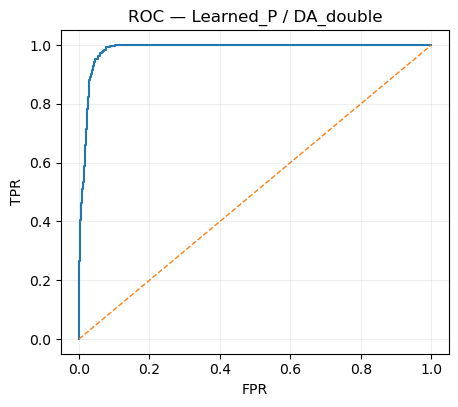

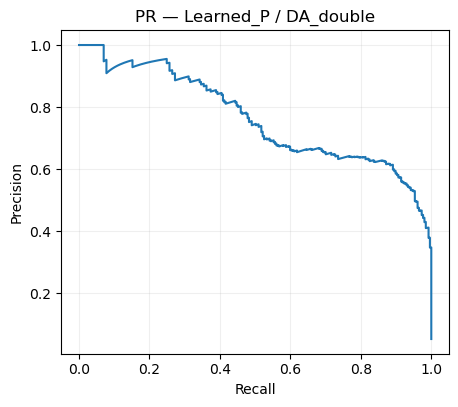

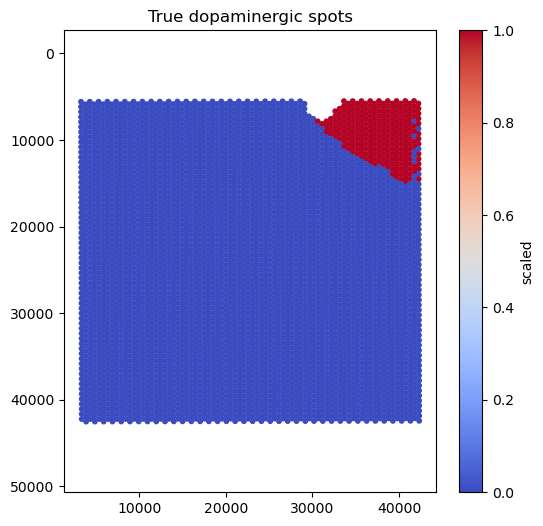

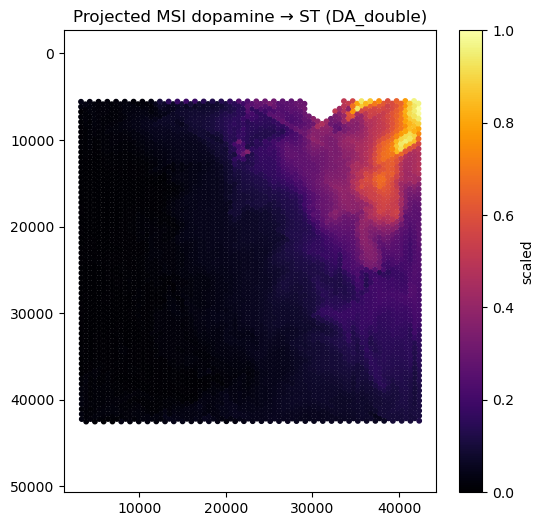

ST: 4968 spots, 17943 genes   |   MSI: 4030 pixels, 20 m/z
MSI→ST (via Learned_P, DA_double): AUROC=0.808 | AUPRC=0.151


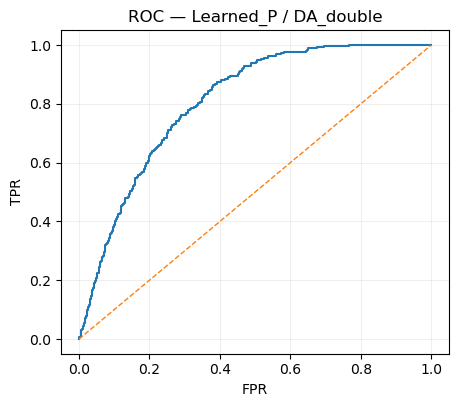

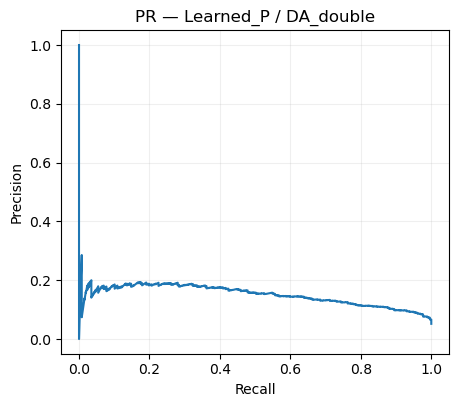

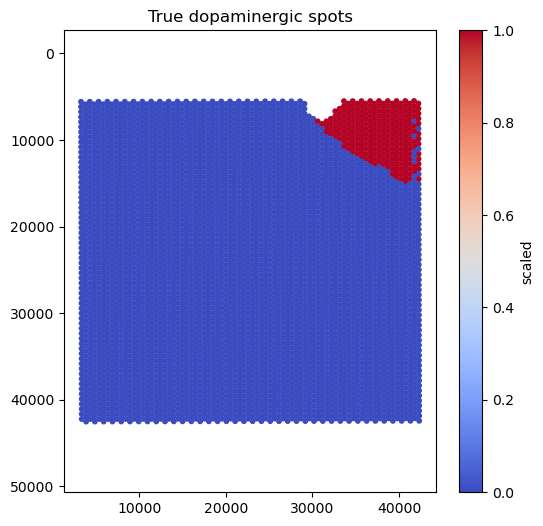

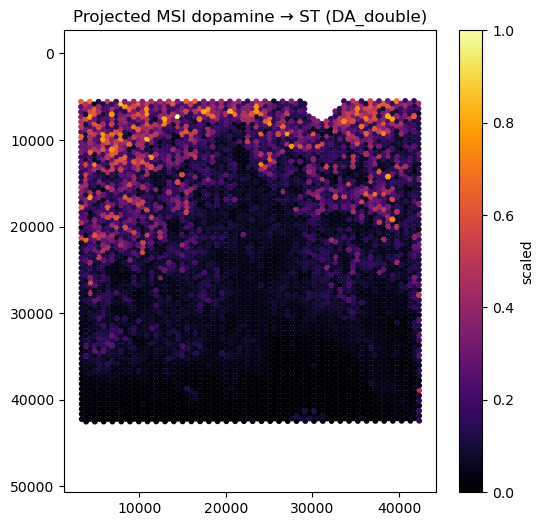

ST: 4968 spots, 17943 genes   |   MSI: 4030 pixels, 20 m/z
MSI→ST (via Learned_P, DA_double): AUROC=0.643 | AUPRC=0.081


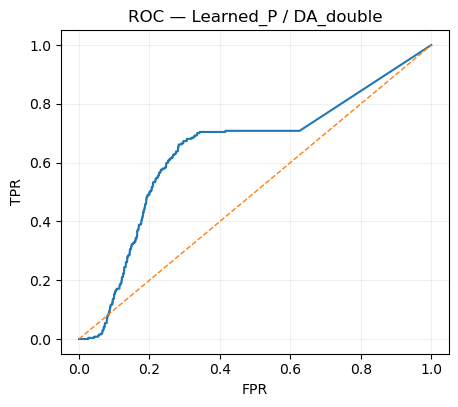

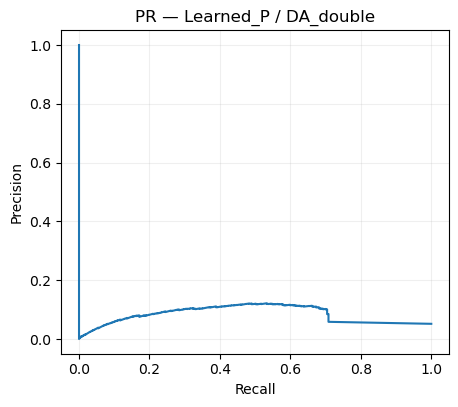

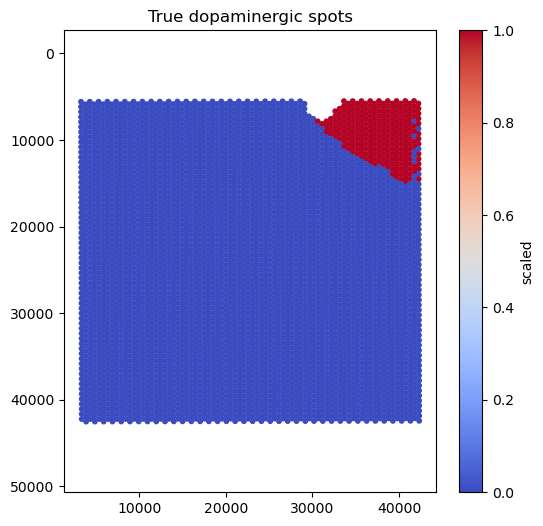

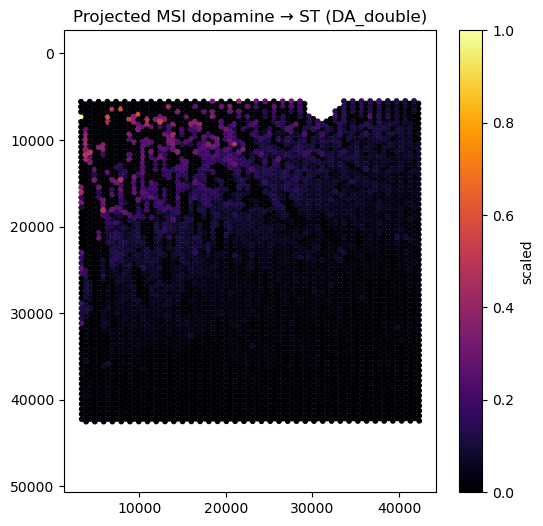

ST: 4968 spots, 17943 genes   |   MSI: 4030 pixels, 20 m/z
MSI→ST (via Learned_P, DA_double): AUROC=0.691 | AUPRC=0.094


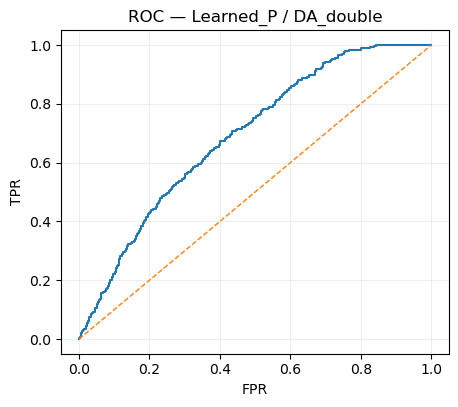

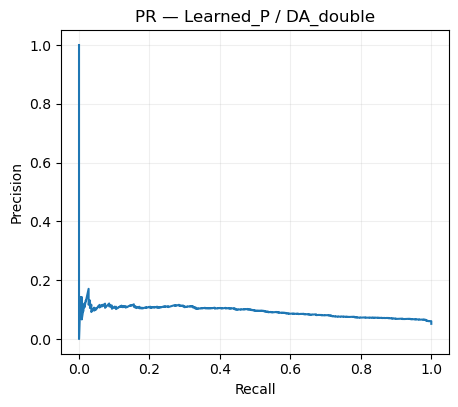

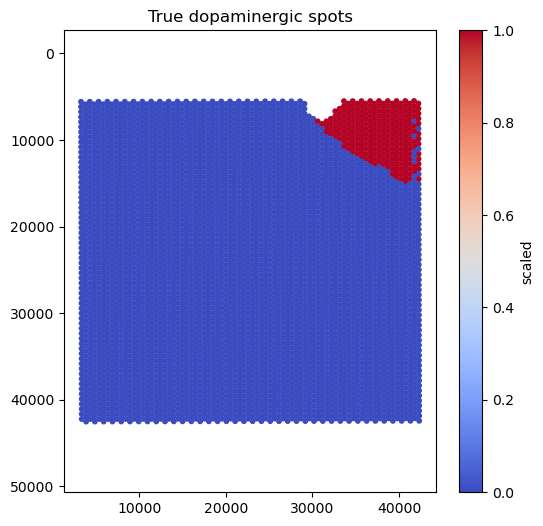

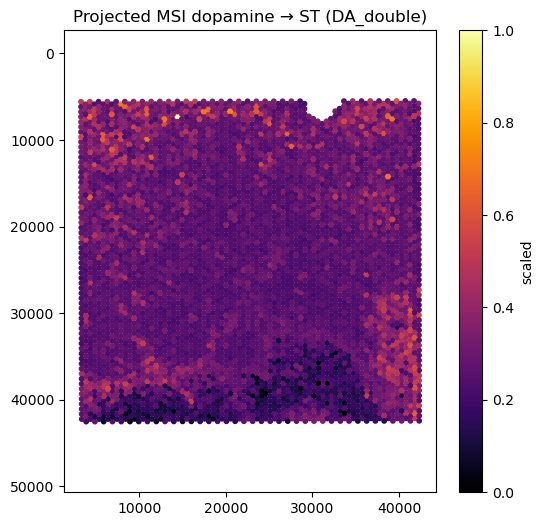

ST: 4968 spots, 17943 genes   |   MSI: 4030 pixels, 20 m/z
MSI→ST (via Learned_P, DA_double): AUROC=0.219 | AUPRC=0.043


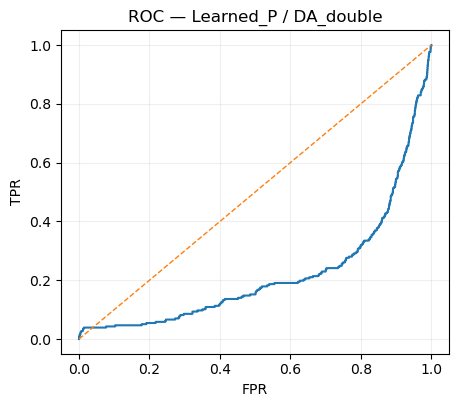

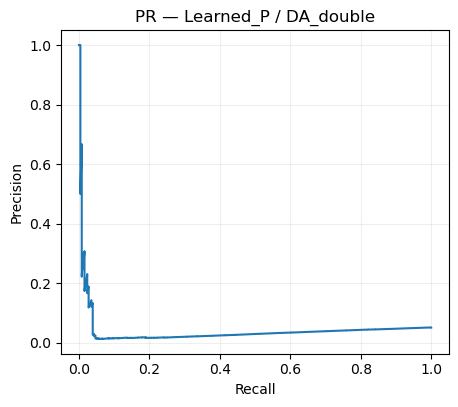

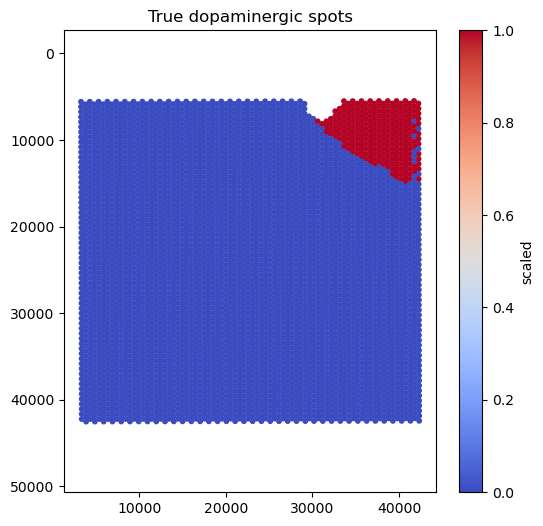

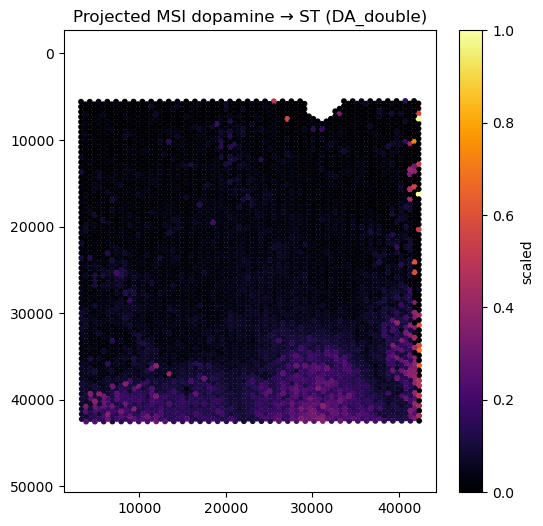

ST: 4968 spots, 17943 genes   |   MSI: 4030 pixels, 20 m/z
MSI→ST (via Learned_P, DA_double): AUROC=0.532 | AUPRC=0.084


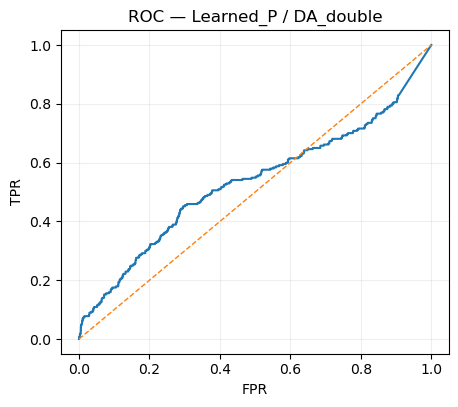

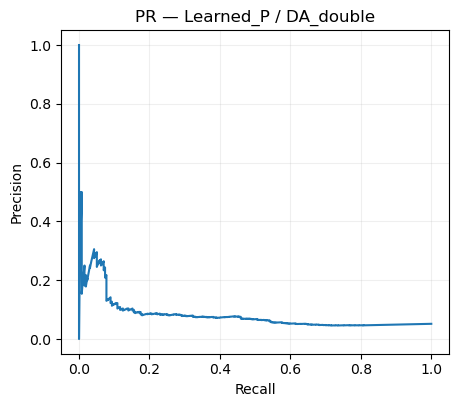

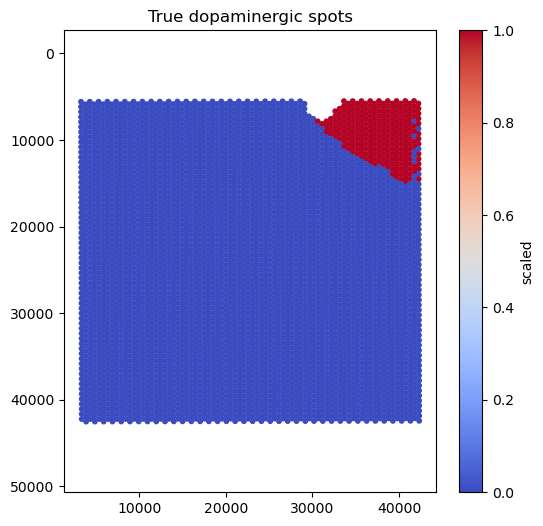

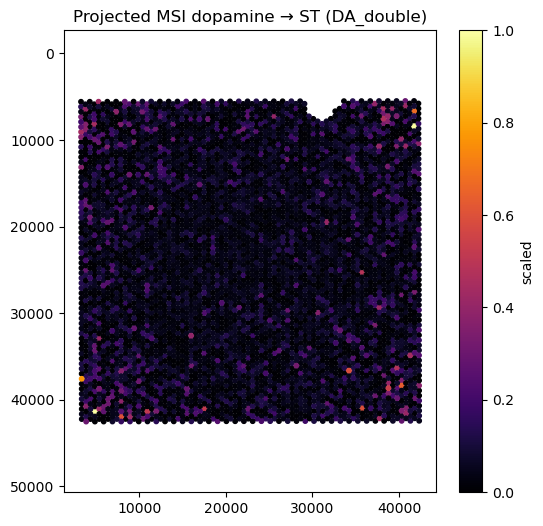

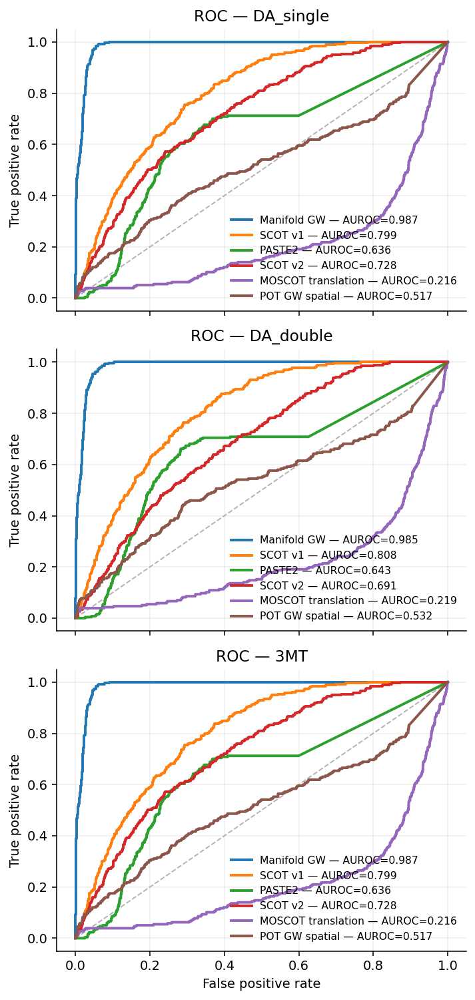

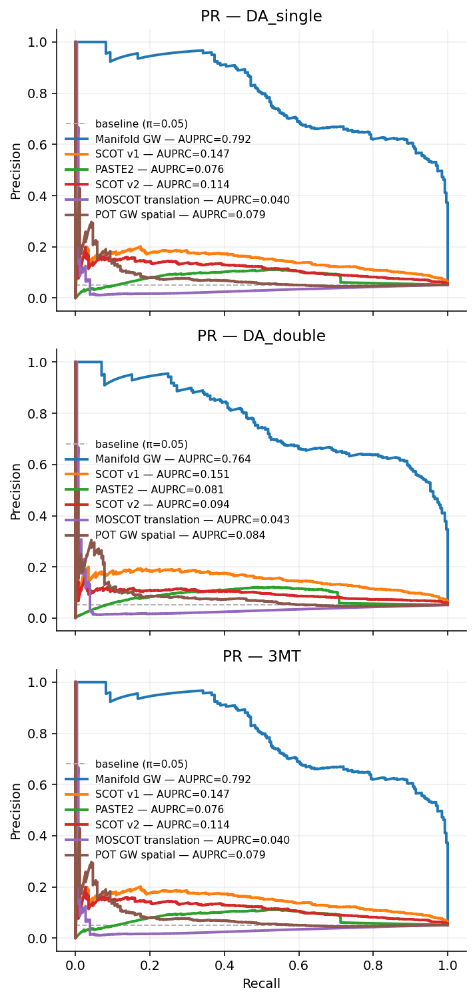

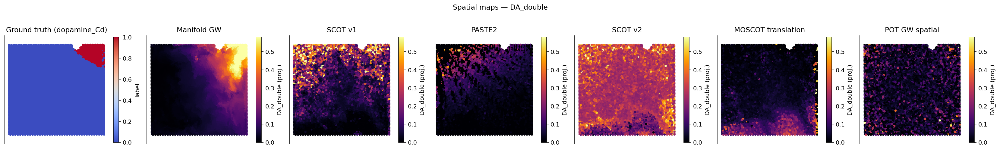

In [70]:
import numpy as np, matplotlib.pyplot as plt, matplotlib as mpl
from sklearn.metrics import roc_curve, precision_recall_curve

# -------------------------
# Global aesthetics (journal-friendly)
# -------------------------
mpl.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 300,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.grid": True,
    "grid.alpha": 0.2,
    "font.size": 10,
})

# Convenience: order & pretty names
method_order = list(methods.keys())  # or manually set an order if you prefer
pretty = lambda s: s.replace("_", " ").replace("MOSCOT", "MOSCOT").replace("GW", "GW")

# Build y (positives = dopamine_Cd)
y = st.obs["dopamine"].astype(str).isin(["dopamine_Cd"]).astype(int).to_numpy()
pos_rate = y.mean()

# -------------------------
# 1) ROC / PR grids per metabolite
# -------------------------
def plot_roc_pr_grids(df_all, scores_cache, y, targets, method_order=None, out_prefix="benchmark"):
    tnames = list(targets.keys())
    if method_order is None:
        method_order = sorted(df_all["method"].unique())

    # --- ROC grid ---
    nrows, ncols = len(tnames), 1
    fig_roc, axes_roc = plt.subplots(nrows, ncols, figsize=(5.2, 3.6*len(tnames)), sharex=True, sharey=True)
    axes_roc = np.atleast_1d(axes_roc)

    for ri, tname in enumerate(tnames):
        ax = axes_roc[ri]
        # Diagonal
        ax.plot([0,1], [0,1], ls="--", lw=1, color="0.7", zorder=0)
        # Methods
        subset = df_all[df_all["target"] == tname]
        # Sort by AUROC desc for legend readability
        subset = subset.sort_values("AUROC", ascending=False)
        used = []
        for m in method_order:
            row = subset[subset["method"] == m]
            if row.empty: 
                continue
            s = scores_cache.get((m, tname))
            if s is None: 
                continue
            fpr, tpr, _ = roc_curve(y, s)
            auroc = row["AUROC"].values[0]
            lbl = f"{pretty(m)} — AUROC={auroc:.3f}"
            ax.plot(fpr, tpr, lw=2, label=lbl)
            used.append(m)
        ax.set_title(f"ROC — {tname}")
        if ri == len(tnames)-1:
            ax.set_xlabel("False positive rate")
        ax.set_ylabel("True positive rate")
        ax.legend(frameon=False, fontsize=8)

    fig_roc.tight_layout()
    fig_roc.savefig(f"{out_prefix}_ROC_grid.svg"); fig_roc.savefig(f"{out_prefix}_ROC_grid.png")
    plt.show()

    # --- PR grid ---
    fig_pr, axes_pr = plt.subplots(nrows, ncols, figsize=(5.2, 3.6*len(tnames)), sharex=True, sharey=True)
    axes_pr = np.atleast_1d(axes_pr)

    for ri, tname in enumerate(tnames):
        ax = axes_pr[ri]
        # Baseline at prevalence
        ax.hlines(pos_rate, 0, 1, ls="--", lw=1, color="0.7", label=f"baseline (π={pos_rate:.2f})", zorder=0)
        subset = df_all[df_all["target"] == tname].sort_values("AUPRC", ascending=False)
        used = []
        for m in method_order:
            row = subset[subset["method"] == m]
            if row.empty: 
                continue
            s = scores_cache.get((m, tname))
            if s is None: 
                continue
            prec, rec, _ = precision_recall_curve(y, s)
            auprc = row["AUPRC"].values[0]
            lbl = f"{pretty(m)} — AUPRC={auprc:.3f}"
            ax.plot(rec, prec, lw=2, label=lbl)
            used.append(m)
        ax.set_title(f"PR — {tname}")
        if ri == len(tnames)-1:
            ax.set_xlabel("Recall")
        ax.set_ylabel("Precision")
        ax.legend(frameon=False, fontsize=8)

    fig_pr.tight_layout()
    fig_pr.savefig(f"{out_prefix}_PR_grid.svg"); fig_pr.savefig(f"{out_prefix}_PR_grid.png")
    plt.show()

# -------------------------
# 2) Spatial maps: ground truth vs. projected intensity per method
# -------------------------
def plot_spatial_panel(st, scores_cache, target_key="DA_double", method_order=None, out_prefix="spatial"):
    if method_order is None:
        method_order = sorted({m for (m, t) in scores_cache.keys() if t == target_key})

    xy = st.obsm["spatial"].astype(float)
    y_bin = st.obs["dopamine"].astype(str).isin(["dopamine_Cd"]).astype(int).to_numpy()

    # consistent color scaling across methods (robust)
    ss = [scores_cache[(m, target_key)] for m in method_order if (m, target_key) in scores_cache]
    vmax = np.nanpercentile(np.concatenate(ss), 99)
    vmin = 0.0

    ncols = len(method_order) + 1  # +1 for ground truth
    fig, axes = plt.subplots(1, ncols, figsize=(3.4*ncols, 3.4), squeeze=False)
    ax = axes[0,0]
    sc0 = ax.scatter(xy[:,0], xy[:,1], c=y_bin, s=8, cmap="coolwarm", vmin=0, vmax=1)
    ax.set_title("Ground truth (dopamine_Cd)")
    ax.invert_yaxis(); ax.axis("equal"); ax.set_xticks([]); ax.set_yticks([])
    cb0 = plt.colorbar(sc0, ax=ax, fraction=0.046, pad=0.04)
    cb0.set_label("label")

    for j, m in enumerate(method_order, start=1):
        if (m, target_key) not in scores_cache: 
            continue
        ax = axes[0,j]
        s = scores_cache[(m, target_key)]
        sc = ax.scatter(xy[:,0], xy[:,1], c=s, s=8, cmap="inferno", vmin=vmin, vmax=vmax)
        ax.set_title(pretty(m))
        ax.invert_yaxis(); ax.axis("equal"); ax.set_xticks([]); ax.set_yticks([])
        cb = plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
        cb.set_label(f"{target_key} (proj.)")

    fig.suptitle(f"Spatial maps — {target_key}", y=1.02, fontsize=12)
    fig.tight_layout()
    fig.savefig(f"{out_prefix}_{target_key}.svg"); fig.savefig(f"{out_prefix}_{target_key}.png")
    plt.show()

# -------------------------
# Run the plots
# -------------------------
plot_roc_pr_grids(df_all, scores_cache, y, targets, method_order=method_order, out_prefix="SMAlign_benchmark")

# Spatial: use DA_double (you can swap to "3MT" or "DA_single")
plot_spatial_panel(st, scores_cache, target_key="DA_double", method_order=method_order, out_prefix="SMAlign_spatial")